# Movies Scoring and Clustering 

This example uses the 'filmtv_movies' dataset to evaluate the quality of the movies and create clusters of similar movies. You can download the Jupyter Notebook of the study <a href="movies.ipynb">here</a>.

<ul class="ul_content">
    <li><b>year: </b>Movie's release year</li>
    <li><b>filmtv_id: </b>Movie ID</li>
    <li><b>title: </b>Movie title</li>
    <li><b>genre: </b>Movie genre</li>
    <li><b>country: </b>Movie's country of origin</li>
    <li><b>description: </b>Movie description</li>
    <li><b>notes: </b>Information about the movie</li>
    <li><b>duration: </b>Movie duration</li>
    <li><b>votes: </b>Number of votes</li>
    <li><b>avg_vote: </b>Average score</li>
    <li><b>director: </b>Movie director</li>
    <li><b>actors: </b>Actors in the movie</li>  
</ul>
		
We will follow the data science cycle (Data Exploration - Data Preparation - Data Modeling - Model Evaluation - Model Deployment) to solve this problem.

## Initialization

This example uses the following version of VerticaPy:

In [1]:
import verticapy as vp

vp.__version__

'1.1.0'

Connect to Vertica. This example uses an existing connection called "VerticaDSN." For details on how to create a connection, use see the <a href="https://www.vertica.com/python/documentation/1.1.x/html/connection.html">connection tutorial</a>.

You can skip the below cell if you already have an established connection.

In [2]:
vp.connect("VerticaDSN")

Connected Successfully!


Let's create a Virtual DataFrame of the dataset. The dataset is available <a href="../../data/filmtv_movies.csv">here</a>.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),123durationInteger,AbccountryVarchar(208),AbcdirectorVarchar(1066),AbcVarchar(2218),123avg_voteNumeric(8),123votesInteger,AbcVarchar(2232),AbcVarchar(1052)
1,18,,1982.0,Comedy,95,United States,Barry Levinson,,7.2,15,,
2,41,,1985.0,Drama,110,France,Vera Belmont,,4.0,1,,
3,75,,1979.0,Drama,120,United States,Milton Katselas,,8.0,2,,
4,91,,1988.0,Comedy,90,United States,Michael Schroeder,,6.0,1,,
5,167,,1965.0,Spy,90,Italy,Enrico Bomba,,3.2,4,,

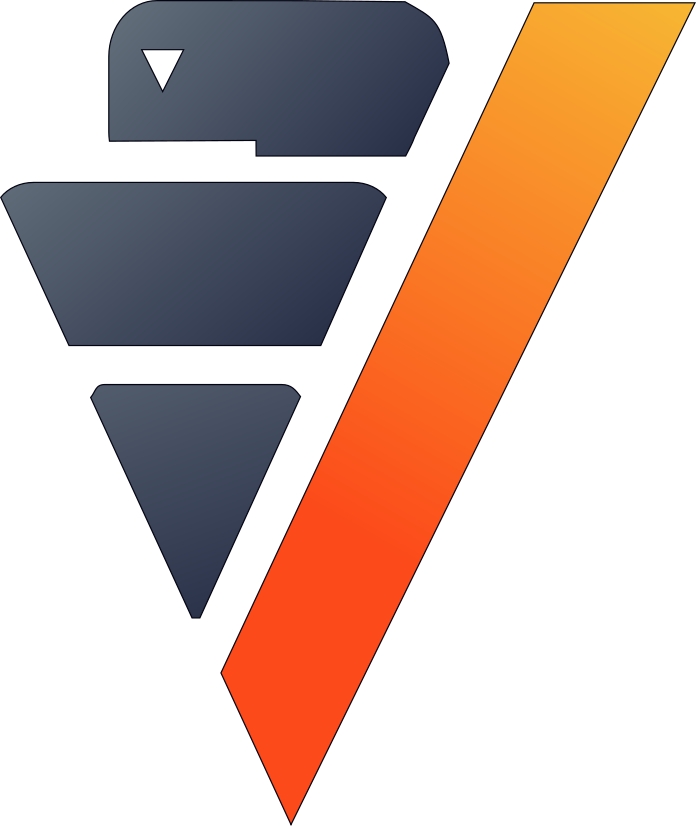

In [3]:
filmtv_movies = vp.read_csv("movies.csv")
filmtv_movies.head(5)

## Data Exploration and Preparation

One of the biggest challenges for any streaming platform is to find a good catalog of movies.

First, let's explore the dataset.

,dtype,count,top,top_percent,unique
"""filmtv_id""",int,53327,18,0.002,53327.0
"""title""",varchar(486),53325,Les Vampires,0.019,50524.0
"""year""","numeric(8,2)",53317,2016.0,3.096,111.0
"""genre""",varchar(22),53125,Drama,30.137,27.0
"""duration""",int,53327,90,11.808,279.0
"""country""",varchar(208),53276,United States,41.142,2394.0
"""director""",varchar(1066),53265,Mario Mattòli,0.137,19146.0
"""actors""",varchar(2218),50307,[null],5.663,50056.0
"""avg_vote""","numeric(6,2)",53327,6.0,15.019,89.0
"""votes""",int,53327,1,22.986,588.0

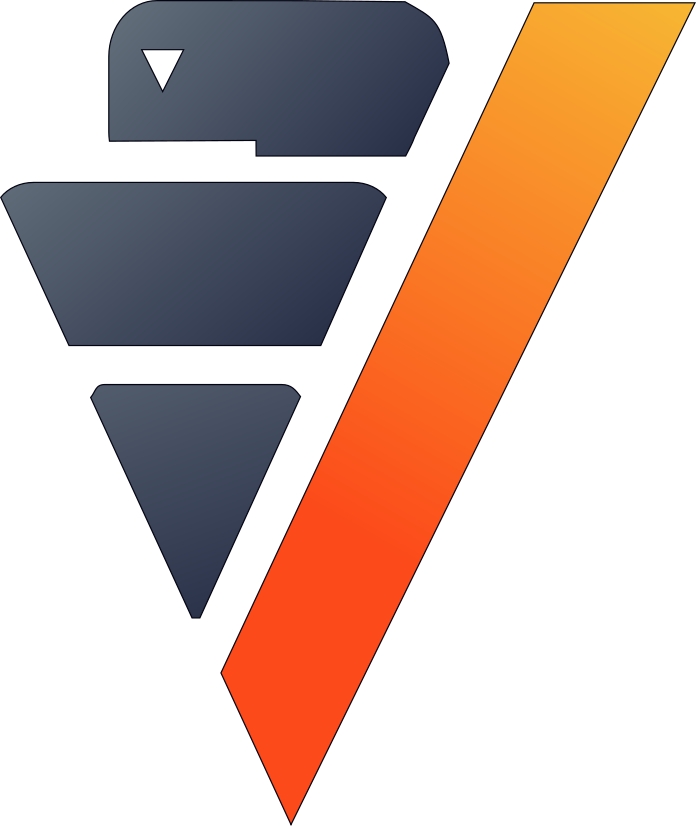

In [4]:
filmtv_movies.describe(method = 'categorical', unique = True)

We can drop the 'description' and 'notes' columns since these fields are empty for most of our dataset.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),123durationInteger,AbccountryVarchar(208),AbcVarchar(1066),AbcVarchar(2218),123avg_voteNumeric(8),123votesInteger
1,24,,1966.0,Thriller,80,Italy,,,6.5,3
2,30,,1968.0,Adventure,101,Italy,,,5.5,2
3,64,,1991.0,Crime,85,Italy,,,4.0,1
4,65,,1981.0,Comedy,94,Canada,,,4.0,1
5,115,,1956.0,Drama,95,United States,,,6.0,3
6,116,,1969.0,Adventure,104,Great Britain,,,4.0,1
7,128,,1952.0,Drama,82,United States,,,4.0,1
8,180,,1964.0,Adventure,91,United States,,,2.5,2
9,181,,1964.0,Western,86,Germany,,,4.5,2
10,188,,1953.0,Musical,97,Italy,,,6.0,7

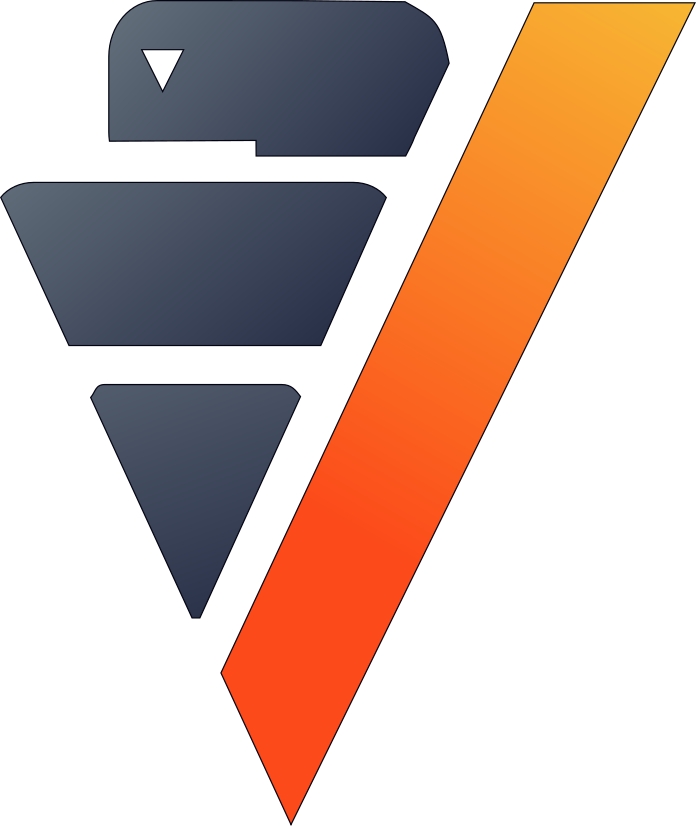

In [5]:
filmtv_movies.drop(["description", "notes"])

We have access to more than 50000 movies in 27 different genres. Let's organize our list by their average rating.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),123durationInteger,AbcVarchar(208),AbcVarchar(1066),AbcVarchar(2218),123avg_voteNumeric(8),123votesInteger
1,27947,,1974.0,Drama,110,,,,10.0,1
2,29218,,1971.0,Drama,97,,,,10.0,1
3,49984,,1989.0,Action,100,,,,10.0,1
4,121261,,2015.0,Drama,90,,,,10.0,2
5,47690,,1993.0,Action,96,,,,10.0,1
6,147231,,2017.0,Documentary,60,,,,10.0,1
7,58452,,2005.0,Horror,67,,,,10.0,1
8,75806,,1948.0,Documentary,71,,,,10.0,1
9,30060,,1956.0,Comedy,98,,,,10.0,1
10,53548,,1989.0,Action,116,,,,10.0,1

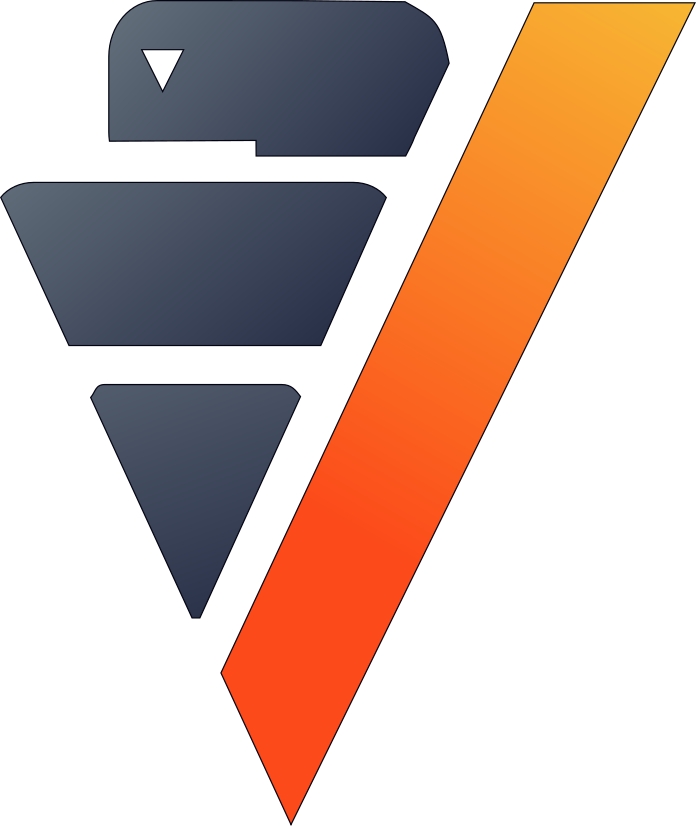

In [6]:
filmtv_movies.sort({"avg_vote" : "desc"})

Since we want properly averaged scores, let's just consider the top 10 movies that have at least 10 votes.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),123durationInteger,AbcVarchar(208),AbcVarchar(1066),AbcVarchar(2218),123avg_voteNumeric(8),123votesInteger
1,25980,,1992.0,Drama,583,,,,9.8,33
2,16567,,1924.0,Drama,100,,,,9.6,58
3,29136,,1985.0,Documentary,544,,,,9.6,24
4,3831,,1948.0,Drama,90,,,,9.4,477
5,5648,,1941.0,Drama,119,,,,9.4,588
6,7042,,1936.0,Comedy,83,,,,9.4,427
7,7753,,1950.0,Drama,100,,,,9.4,535
8,12135,,1994.0,Drama,450,,,,9.4,72
9,23395,,1954.0,Adventure,200,,,,9.4,325
10,27908,,1962.0,Drama,135,,,,9.4,68

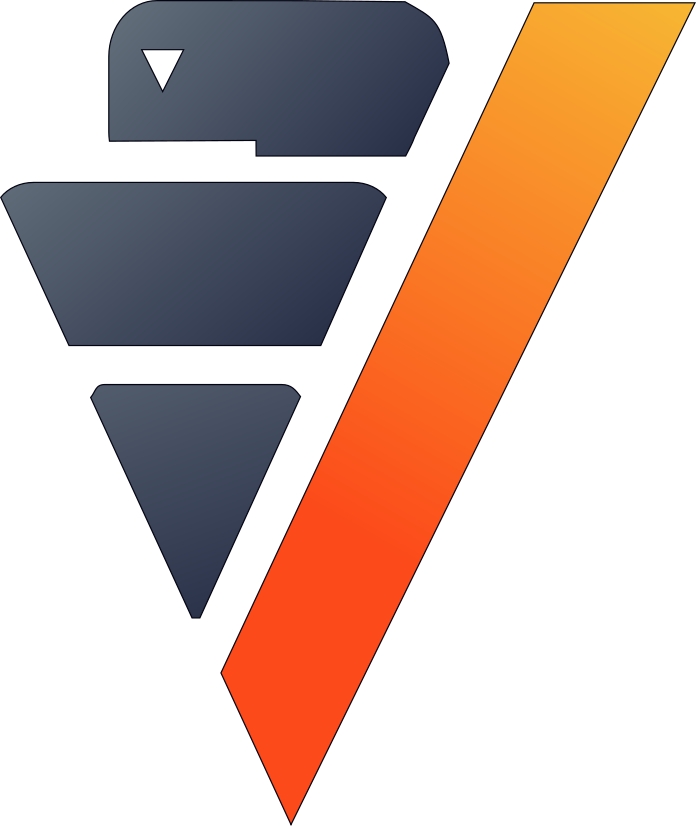

In [7]:
filmtv_movies.search(
    conditions = [filmtv_movies["votes"] > 10], 
    order_by = {"avg_vote" : "desc"},
)

We can see classic movies like 'The Godfather' and 'Greed.' Let's smooth the avg_vote using a linear regression to make it more representative.

To create our model we could use the votes, the category, the duration, etc. but let's go with the director and main actors. 

We can extract the five main actors for each movie with regular expressions.

,value
name,"""actor"""
dtype,varchar(2218)
unique,74852.0
count,191418.0
Others,190827
[null],21890
Totò,100
Ciccio Ingrassia,91
John Wayne,85
Franco Franchi,83

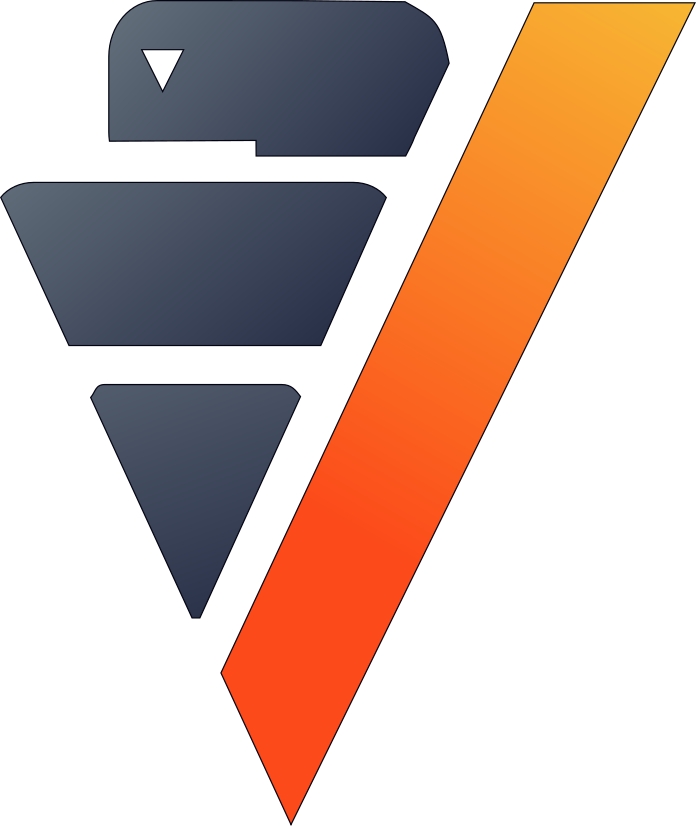

In [8]:
for i in range(1, 5):
    filmtv_movies2 = vp.read_csv("movies.csv")
    filmtv_movies2.regexp(
        column = "actors",
        method = "substr",
        pattern = '[^,]+',
        occurrence = i,
        name = "actor",
    )
    if i == 1:
        filmtv_movies = filmtv_movies2.copy()
    else:
        filmtv_movies = filmtv_movies.append(filmtv_movies2)
filmtv_movies["actor"].describe()

By aggregating the data, we can find the number of actors and the number of votes by actor. We can then normalize the data using the min-max method and quantify the notoriety of the actors.

1 element was filtered.


,AbcactorVarchar(2218),123notoriety_actorsNumeric(36),123castings_actorsInteger
1,Juno Temple,0.048083765375623,13
2,Jacques Maury,0.0,1
3,Sharif Atkins,0.001626512148013,1
4,Lu Yi-Ching,0.0,1
5,Matthew Broderick,0.093219477482972,14
6,Rouxnet Brown,0.000101657009251,1
7,Rolf Wenkhaus,0.000101657009251,1
8,Kathleen Rose Perkins,0.001219884111009,2
9,André Luguet,0.002134797194267,5
10,Thomas Lennon,0.01026735793433,4

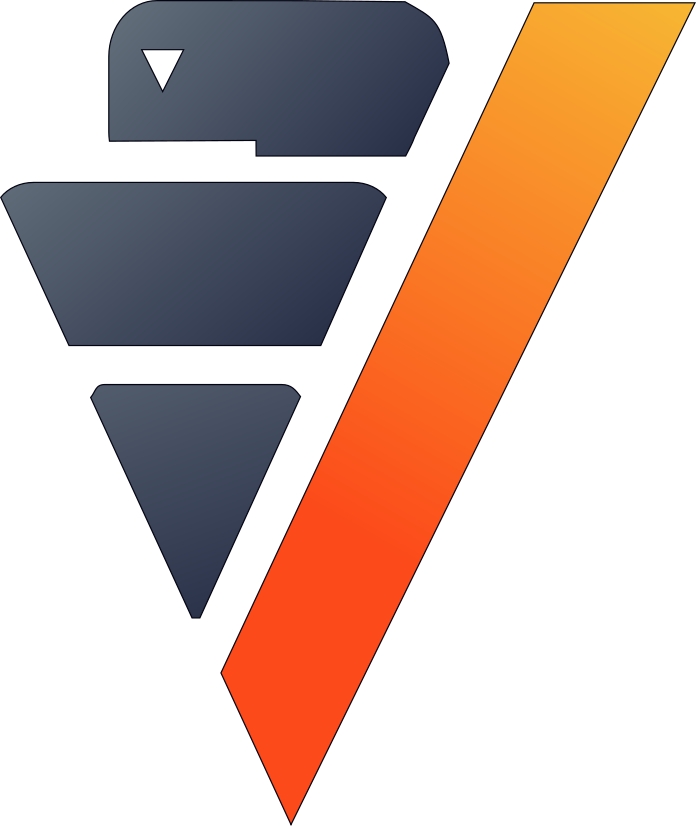

In [9]:
import verticapy.sql.functions as fun

actors_stats = filmtv_movies.groupby(
    columns = ["actor"], 
    expr = [
        fun.sum(filmtv_movies["votes"])._as("notoriety_actors"),
        fun.count(filmtv_movies["actors"])._as("castings_actors"),
    ],
)
actors_stats["actor"].dropna()
actors_stats["notoriety_actors"].normalize(method = 'minmax')

Let's look at the top ten actors by notoriety.

,AbcactorVarchar(2218),123notoriety_actorsNumeric(36),123castings_actorsInteger
1,Robert De Niro,1.0,57
2,Morgan Freeman,0.861441496391176,52
3,Clint Eastwood,0.856460302937888,43
4,Tom Cruise,0.820372064653858,34
5,Johnny Depp,0.814882586154315,34
6,Tom Hanks,0.771881671241232,37
7,Samuel L. Jackson,0.742502795567754,49
8,Brad Pitt,0.72776252922639,26
9,Leonardo DiCaprio,0.715462031107045,20
10,Al Pacino,0.648368405001525,40

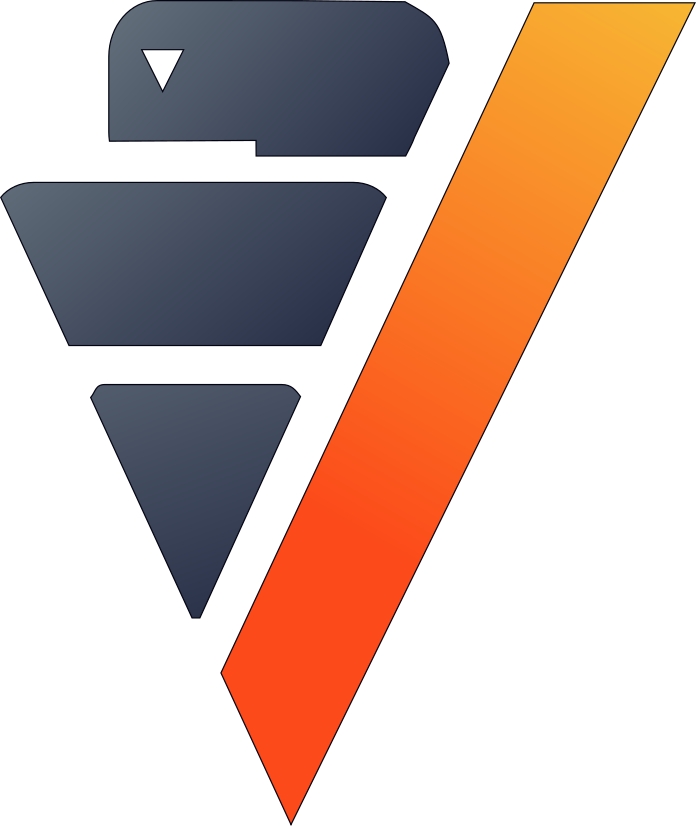

In [10]:
actors_stats.search(
    order_by = {
        "notoriety_actors" : "desc", 
        "castings_actors" : "desc",
    },
).head(10)

As expected, we get a list of very popular actors like Robert De Niro, Morgan Freeman, and Clint Eastwood.

Let's do the same for the directors.

,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger
1,,0.000259965337955,8
2,,0.000259965337955,4
3,,0.008145580589255,4
4,,0.000346620450607,8
5,,0.0,4
6,,0.000606585788562,4
7,,0.090641247833622,36
8,,0.000259965337955,4
9,,0.001126516464471,4
10,,0.000953206239168,12

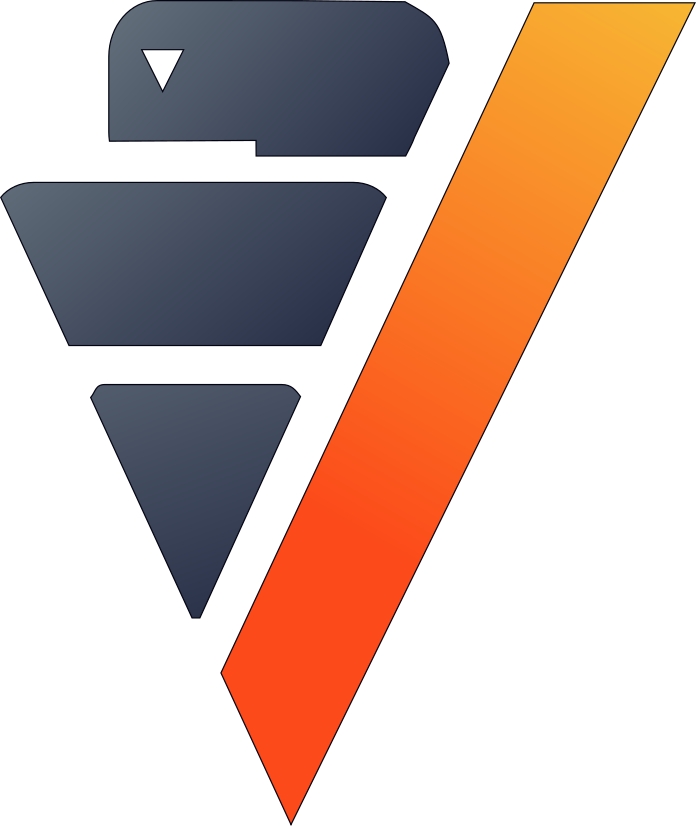

In [11]:
director_stats = filmtv_movies.groupby(
    columns = ["director"], 
    expr = [
        fun.sum(filmtv_movies["votes"])._as("notoriety_director"),
        fun.count(filmtv_movies["director"])._as("castings_director"),
    ],
)
director_stats["notoriety_director"].normalize(method = "minmax")

Now let's look at the top 10 movie directors.

,AbcdirectorVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger
1,Steven Spielberg,1.0,132
2,Woody Allen,0.962045060658579,192
3,Clint Eastwood,0.893067590987868,152
4,Martin Scorsese,0.829289428076256,140
5,Alfred Hitchcock,0.753379549393414,208
6,Quentin Tarantino,0.686741767764298,40
7,Ridley Scott,0.655459272097054,108
8,Stanley Kubrick,0.649913344887348,48
9,Tim Burton,0.588214904679376,72
10,David Cronenberg,0.513431542461005,84

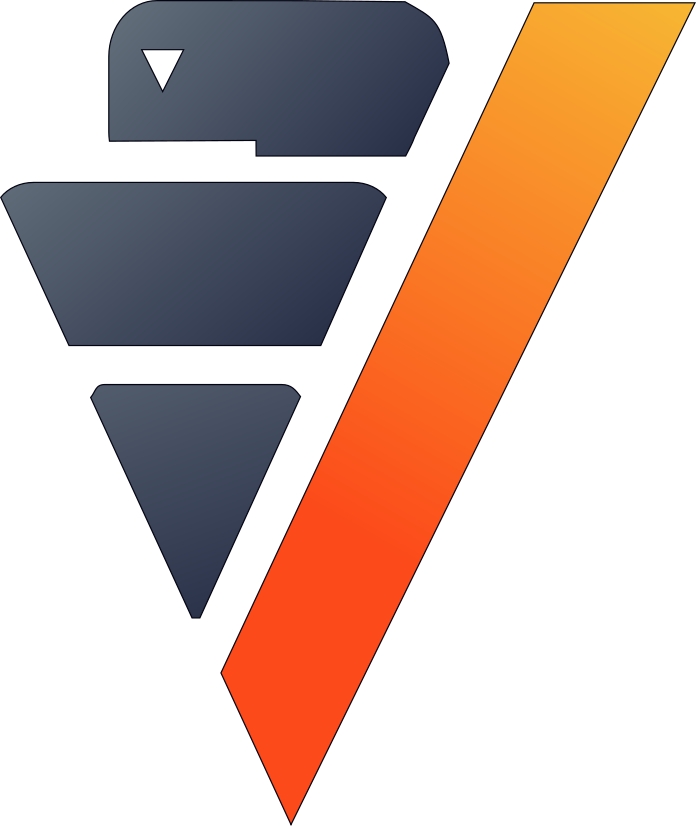

In [12]:
director_stats.search(
    order_by = {
        "notoriety_director" : "desc", 
        "castings_director" : "desc",
    },
).head(10)

Again, we get a list of popular directors like Steven Spielberg, Woody Allen, and Clint Eastwood.

Let's join our notoriety metrics for actors and directors with the main dataset.

In [13]:
filmtv_movies_director = filmtv_movies.join(
    director_stats,
    on = {"director": "director"},
    how = "left",
    expr1 = ["*"],
    expr2 = [
        "notoriety_director", 
        "castings_director",
    ],
)
filmtv_movies_director_actors = filmtv_movies_director.join(
    actors_stats,
    on = {'actor': 'actor'},
    how = "left",
    expr1 = ["*"],
    expr2 = [
        "notoriety_actors",
        "castings_actors",
    ],
)

As we did many operation, it can be nice to save the vDataFrame as a table in the Vertica database.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),123durationInteger,AbccountryVarchar(208),AbcVarchar(1066),AbcVarchar(2218),123avg_voteNumeric(8),123votesInteger,AbcVarchar(2232),AbcVarchar(1052),AbcactorVarchar(2218),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsNumeric(36),123castings_actorsInteger
1,61,,1966.0,Western,98,United States,,,7.0,24,,,Anjanette Comer,0.029116117850953,120,0.004981193453289,8
2,61,,1966.0,Western,98,United States,,,7.0,24,,,Emilio Fernández,0.029116117850953,120,0.004269594388533,2
3,61,,1966.0,Western,98,United States,,,7.0,24,,,Marlon Brando,0.029116117850953,120,0.339941038934635,32
4,61,,1966.0,Western,98,United States,,,7.0,24,,,John Saxon,0.029116117850953,120,0.120666869980685,26
5,113,,1990.0,Thriller,100,United States,,,6.0,1,"<input style=""background-color: #FFFFFF; border: none; color: #000000; text-align: center; width: 270px;"" type=""text"" value=""In the city of Boston, Carol Stuart, a pregnant woman, is killed by a black man. At least that's what her husband Chuck claims in front of the police officers in charge of the investigation. From that moment the racial tensions in the city became more acute. Michelle Caruso, a journalist, is convinced that the culprit is Chuck himself and begins to investigate on his own. He soon discovers that ..."" readonly>",,James Handy,0.001733102253033,36,0.007014333638304,6
6,113,,1990.0,Thriller,100,United States,,,6.0,1,"<input style=""background-color: #FFFFFF; border: none; color: #000000; text-align: center; width: 270px;"" type=""text"" value=""In the city of Boston, Carol Stuart, a pregnant woman, is killed by a black man. At least that's what her husband Chuck claims in front of the police officers in charge of the investigation. From that moment the racial tensions in the city became more acute. Michelle Caruso, a journalist, is convinced that the culprit is Chuck himself and begins to investigate on his own. He soon discovers that ..."" readonly>",,Ken Olin,0.001733102253033,36,0.000508285046254,4
7,113,,1990.0,Thriller,100,United States,,,6.0,1,"<input style=""background-color: #FFFFFF; border: none; color: #000000; text-align: center; width: 270px;"" type=""text"" value=""In the city of Boston, Carol Stuart, a pregnant woman, is killed by a black man. At least that's what her husband Chuck claims in front of the police officers in charge of the investigation. From that moment the racial tensions in the city became more acute. Michelle Caruso, a journalist, is convinced that the culprit is Chuck himself and begins to investigate on his own. He soon discovers that ..."" readonly>",,Margaret Colin,0.001733102253033,36,0.028463962590221,9
8,113,,1990.0,Thriller,100,United States,,,6.0,1,"<input style=""background-color: #FFFFFF; border: none; color: #000000; text-align: center; width: 270px;"" type=""text"" value=""In the city of Boston, Carol Stuart, a pregnant woman, is killed by a black man. At least that's what her husband Chuck claims in front of the police officers in charge of the investigation. From that moment the racial tensions in the city became more acute. Michelle Caruso, a journalist, is convinced that the culprit is Chuck himself and begins to investigate on his own. He soon discovers that ..."" readonly>",,Annabella Price,0.001733102253033,36,0.000304971027752,2
9,136,,1966.0,Spy,100,United States,,,4.8,4,"<input style=""background-color: #FFFFFF; border: none; color: #000000; text-align: center; width: 270px;"" type=""text"" value=""Professor Bower is sent to the Soviet Union by US secret services to meet Professor Goshenko who seems willing to hand over some scientific information. While in Leipzig Bower falls into the hands of the KGB and is accused of espionage, Salzer, a trusted person, manages to meet Goshenko and get hold of a microfilm. His intention is to deliver it to Bower (and it happens), but both he and Goshenko are killed. Meanwhile Bower, realizin
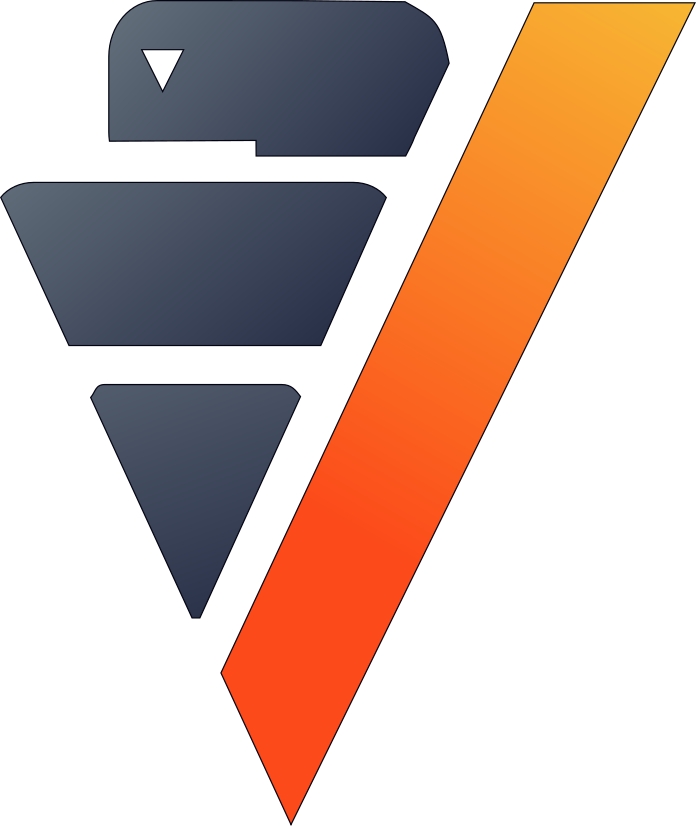

In [14]:
vp.drop("filmtv_movies_director_actors", method = "table")
filmtv_movies_director_actors.to_db(
    name = "filmtv_movies_director_actors", 
    relation_type = "table",
    inplace = True,
)

We can aggregate the data to get metrics on each movie.

In [15]:
filmtv_movies_complete = filmtv_movies_director_actors.groupby(
    columns = [
        "filmtv_id", 
        "title",
        "year",
        "genre",
        "country",
        "avg_vote",
        "votes", 
        "duration", 
        "director", 
        "notoriety_director",
        "castings_director",
    ],
    expr = [
        fun.sum(filmtv_movies_director_actors["notoriety_actors"])._as("notoriety_actors"),
        fun.sum(filmtv_movies_director_actors["castings_actors"])._as("castings_actors"),
    ],
)

Let's compute some statistics on our dataset.

,"123""filmtv_id""Integer100%","123""year""Numeric(10)99%","123""avg_vote""Numeric(8)100%","123""votes""Integer100%","123""duration""Integer100%","123""notoriety_director""Numeric(36)99%","123""castings_director""Integer99%","123""notoriety_actors""Numeric(36)94%","123""castings_actors""Integer94%","Abc""title""Varchar(486)99%","Abc""genre""Varchar(22)99%","Abc""country""Varchar(208)99%","Abc""director""Varchar(1066)99%"
dtype,integer,numeric(10),numeric(8),integer,integer,numeric(36),integer,numeric(36),integer,varchar(486),varchar(22),varchar(208),varchar(1066)
percent,100.0,99.981,100.0,100.0,100.0,99.884,99.884,94.337,94.337,99.996,99.621,99.904,99.884
count,53327,53317,53327,53327,53327,53265,53265,50307,50307,53325,53125,53276,53265
top,18,2016.0,6.0,1,90,0.0,4,[null],4,Les Vampires,Drama,United States,Mario Mattòli
top_percent,0.002,3.096,15.019,22.986,11.808,7.977,22.321,5.663,6.049,0.019,30.137,41.142,0.137
avg,44527.3789825042,1991.00457640152,5.84471656009151,24.5455772873029,98.4576480957114,0.0302092021824106,41.5502112081104,0.151038770167094,38.955692050808,17.5092358180966,6.51471058823529,11.4996058262632,14.9825213554867
stddev,42396.5197156384,22.8951537488776,1.52384631163876,61.0022977584917,35.32557412934,0.0811338082502093,47.9503934974454,0.228619371011083,33.9911513007008,9.67940127497949,1.78409673531694,6.36585063280328,7.95519700230993
min,18,1897.0,0.5,1,40,0.0,4,0.0,1,1,3,4,3
approx_25%,15031.1066666667,1975.0,5.0,2.0,89.0,0.000606585788562,8.0,0.00954178103080217,11.0,11,5,6,12
approx_50%,31463.6721311475,1997.0,6.0,5.0,95.0,0.004159445407279,24.0,0.0576219971746364,30.0,16,6,13,14

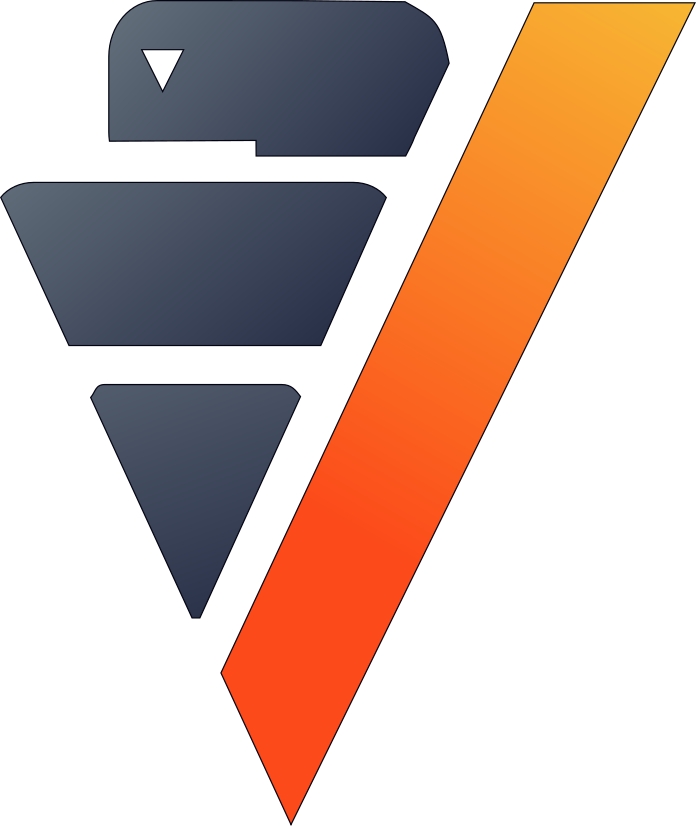

In [16]:
filmtv_movies_complete.describe(method = "all")

We can use the movie's release year to get create three categories.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),AbccountryVarchar(208),123avg_voteNumeric(8),123votesInteger,123durationInteger,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsNumeric(36),123castings_actorsInteger,AbcperiodVarchar(6)
1,72843,,2016.0,Thriller,United States,5.2,32,91,,0.026429809358752,20,0.148317576496899,25,Recent
2,47227,,1975.0,Comedy,Italy,6.0,2,95,,0.007019064124783,20,0.117718816712412,44,Old
3,147978,,2014.0,Horror,United States,3.3,6,92,,0.000433275563258,4,0.019619802785403,28,Recent
4,53327,,2014.0,Fantasy,United States,5.6,166,121,,0.031629116117851,20,1.325607400630272,99,Recent
5,37521,,2007.0,Drama,United States,10.0,2,93,,8.6655112652e-05,4,0.057842838263699,35,Recent
6,16561,,1996.0,Thriller,United States,5.0,2,85,,0.004072790294627,56,0.398292162244587,97,90s
7,15222,,1996.0,Fantasy,United States,7.7,381,103,,0.588214904679376,72,0.944698586967572,102,90s
8,53952,,2006.0,Thriller,Spain,2.0,1,80,,0.0,4,0.011690556063841,14,Recent
9,3175,,1992.0,Action,United States,6.0,1,100,,0.0,4,0.000101657009251,3,90s
10,6465,,1970.0,Western,Italy,3.9,8,96,,0.001733102253033,28,0.041882687811325,57,Old

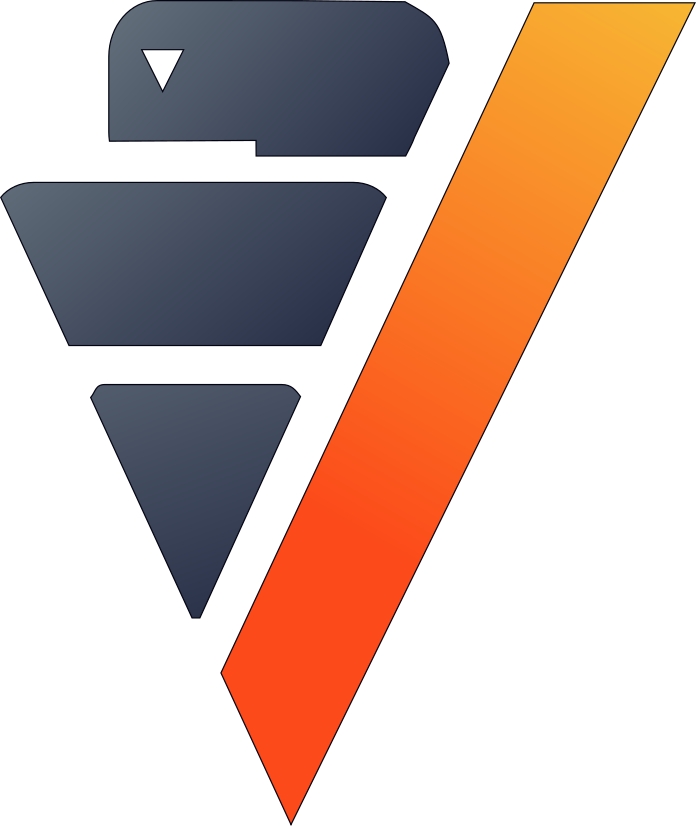

In [17]:
filmtv_movies_complete.case_when(
    "period",
    filmtv_movies_complete["year"] < 1990, "Old",
    filmtv_movies_complete["year"] >= 2000, "Recent", "90s",
) 

Now, let's look at the countries that made the most movies.

,AbccountryVarchar(208),123COUNTInteger
1,United States,21940
2,Italy,9056
3,France,3040
4,Great Britain,2516
5,Germany,1697
6,Japan,1131
7,Canada,1053
8,Spain,562
9,"Italy, France",403
10,Hong Kong,380

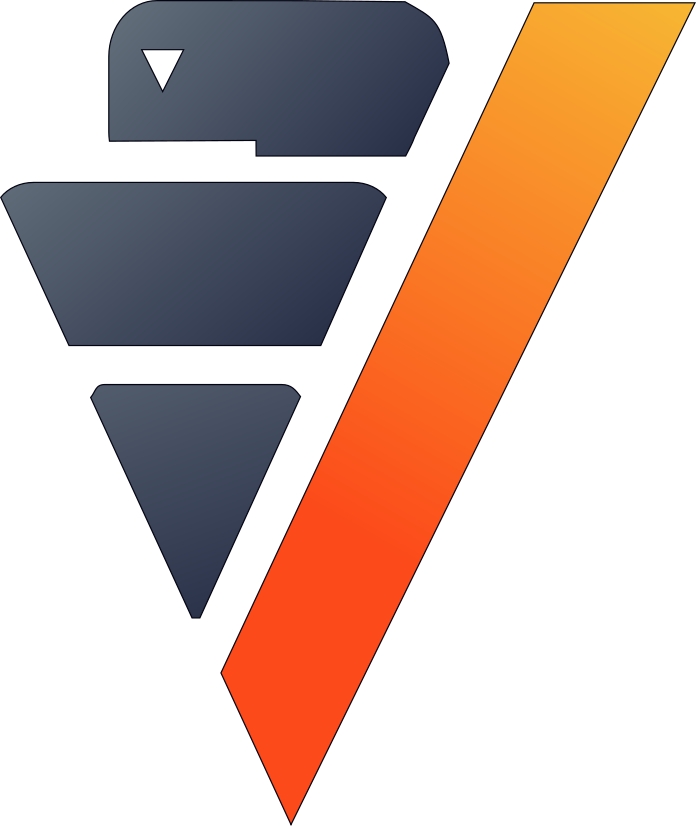

In [18]:
filmtv_movies_complete.groupby(
    columns = ["country"], 
    expr = ["COUNT(*)"],
).sort(
    {"count" : "desc"},
).head(10)

We can use this variable to create language groups.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),AbcVarchar(208),123avg_voteNumeric(8),123votesInteger,123durationInteger,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsNumeric(36),123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19)
1,55227,,2012.0,Drama,,5.5,4,52,,0.160658578856153,64,0.001321541120259,5,Recent,German_North_Europe
2,77086,,2014.0,Drama,,4.0,1,104,,0.0,4,0.063535630781742,19,Recent,English
3,51410,,1973.0,[null],,4.0,1,110,,0.00103986135182,16,0.058859408356206,21,Old,English
4,63362,,2014.0,Comedy,,4.0,11,100,,0.006672443674177,16,0.090678052251703,41,Recent,English
5,159947,,2018.0,Comedy,,3.7,10,106,,0.000779896013865,4,0.02327945511843,7,Recent,Italian
6,8288,,1933.0,Comedy,,6.0,1,74,,0.002253032928943,36,0.006811019619803,12,Old,English
7,36733,,2006.0,Drama,,6.1,51,120,,0.057712305025997,24,0.679780420860019,75,Recent,English
8,32330,,2005.0,Drama,,7.2,62,112,,0.017244367417678,44,0.457253227610044,49,Recent,Spanish_Portuguese
9,25885,,2003.0,Action,,5.6,178,121,,0.053726169844021,16,0.407237979058656,49,Recent,English
10,36742,,2007.0,Drama,,6.1,279,110,,0.167417677642981,48,0.782352343194064,72,Recent,Italian

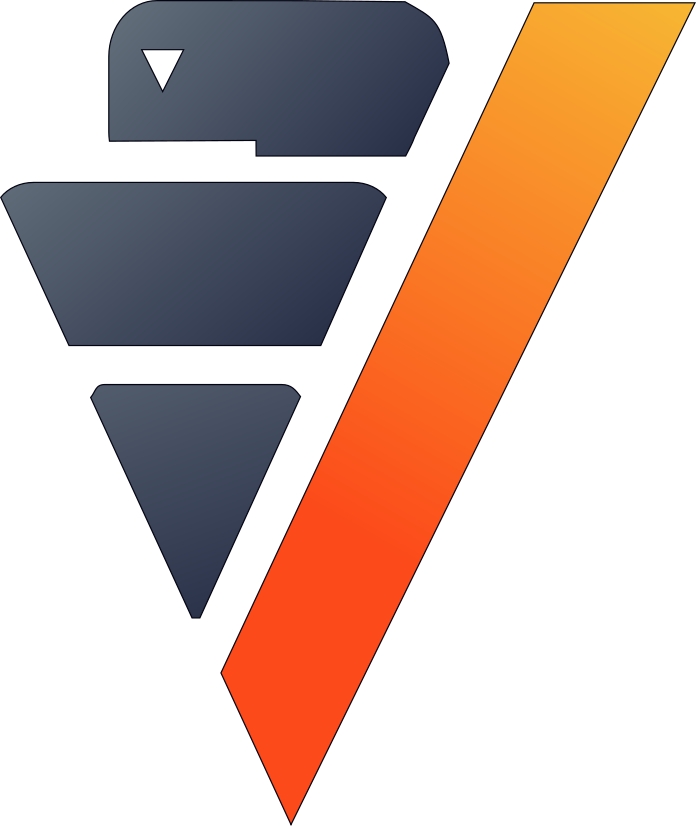

In [19]:
# Language Discretization
Arabic_Middle_Est = ["Arab", "Iran", "Turkey", "Egypt", "Tunisia",
                     "Lebanon", "Palestine", "Morocco", "Iraq",
                     "Sudan", "Algeria", "Yemen", "Afghanistan",
                     "Azerbaijan", "Kazakhstan", "Kyrgyzstan",
                     "Kurdistan", "Syria", "Uzbekistan",]
Chinese_Japan_Asian = ["Japan", "Hong Kong", "China", "South Korea", 
                       "Thailand", "Philippines", "Taiwan", "Indonesia",
                       "Singapore", "Malaysia", "Vietnam", "Laos", "Cambodia",
                       "Bhutan",]
Indian = ["India", "Pakistan", "Nepal", "Sri Lanka", "Bangladesh",]
Hebrew = ["Israel"]
Spanish_Portuguese = ["Spain", "Portugal", "Mexico", "Brasil", "Chile",
                      "Argentina", "Colombia", "Cuba", "Venezuela", "Peru",
                      "Uruguay", "Dominican Republic", "Ecuador", "Guatemala",
                      "Costa Rica", "Paraguay", "Bolivia",]
English = ["United States", "England", "Great Britain", "Ireland",
           "Australia", "New Zealand", "South Africa",]
French = ["France", "Canada", "Belgium", "Switzerland", "Luxembourg",]
Italian = ["Italy",]
German_North_Europe = ["German", "Austria", "Holland", "Netherlands", "Denmark",
                       "Norway", "Iceland", "Finland", "Sweden", "Greenland"]
Russian_Est_Europe = ["Russia", "Soviet Union", "Yugoslavia", "Czechoslovakia",
                      "Poland", "Bulgaria", "Croatia", "Czech Republic", "Serbia",
                      "Ukraine", "Slovenia", "Lithuania", "Latvia", "Estonia", 
                      "Bosnia and Herzegovina", "Georgia",]
Grec_Balkan = ["Greece", "Macedonia", "Cyprus", "Romania", "Armenia", "Hungary",
               "Albania", "Malta",]

# Creation of the new feature
filmtv_movies_complete.case_when(
        'language_area', 
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Arabic_Middle_Est))), 'Arabic_Middle_Est',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Chinese_Japan_Asian))), 'Chinese_Japan_Asian', 
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Indian))), 'Indian', 
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Hebrew))), 'Hebrew', 
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Spanish_Portuguese))), 'Spanish_Portuguese', 
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(English))), 'English',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(French))), 'French',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Italian))), 'Italian',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(German_North_Europe))), 'German_North_Europe',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Russian_Est_Europe))), 'Russian_Est_Europe',
        vp.StringSQL("REGEXP_LIKE(Country, '{}')".format("|".join(Grec_Balkan))), 'Grec_Balkan', 
        'Others',
) 

We can do the same for the genres.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcgenreVarchar(22),AbcVarchar(208),123avg_voteNumeric(8),123votesInteger,123durationInteger,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsNumeric(36),123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,14402,,1984.0,Biography,,6.6,23,88,,0.26421143847487,188,0.131340855952018,47,Old,Italian,Others
2,911,,1957.0,Musical,,7.0,15,117,,0.016897746967071,64,0.136118735386805,48,Old,English,Others
3,170537,,2019.0,Comedy,,4.0,7,75,,0.000693240901213,8,0.007217647656806,11,Recent,Spanish_Portuguese,Comedy
4,54735,,2012.0,Comedy,,8.0,1,102,,0.0,4,0.003253024296025,8,Recent,Spanish_Portuguese,Comedy
5,60279,,2008.0,Drama,,5.8,6,105,,0.000433275563258,4,0.087323370946427,20,Recent,German_North_Europe,Drama
6,55505,,2006.0,Horror,,5.5,2,109,,8.6655112652e-05,4,0.008539188777067,10,Recent,Chinese_Japan_Asian,Horror
7,20708,,1997.0,Animation,,4.7,16,72,,0.001299826689775,4,[null],[null],90s,English,Animation
8,16129,,1979.0,Comedy,,6.5,2,99,,8.6655112652e-05,4,0.072379790586562,32,Old,English,Comedy
9,28153,,1941.0,Drama,,7.3,16,70,,0.199220103986135,248,0.052963301819661,31,Old,English,Drama
10,13141,,1994.0,Drama,,7.7,4,89,,0.001386481802426,28,0.007420961675308,18,90s,English,Drama

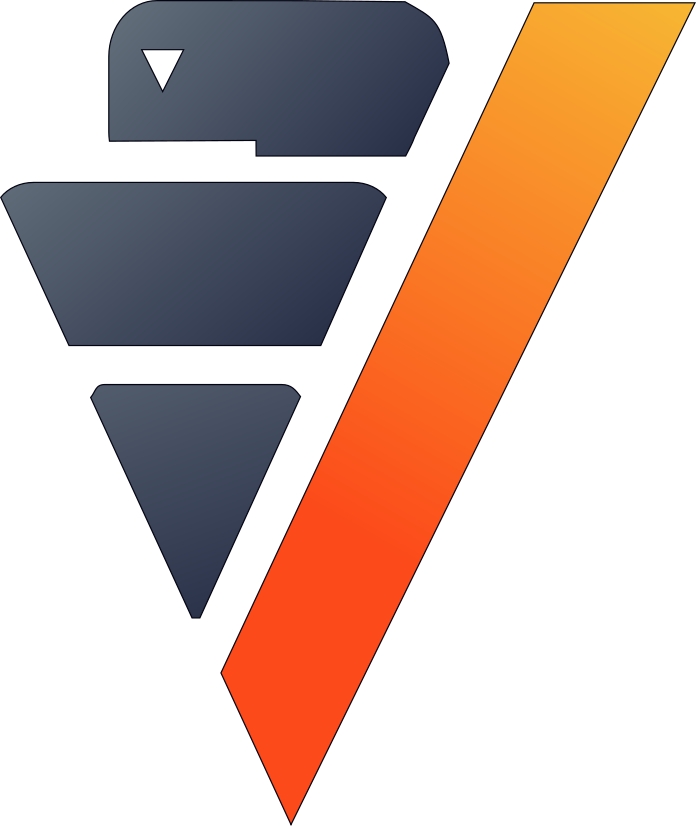

In [20]:
filmtv_movies_complete.case_when(
         'Category', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Drama|Noir')"), 'Drama', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Comedy|Grotesque')"), 'Comedy', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Fantasy|Super-hero')"), 'Fantasy', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Romantic|Sperimental|Mélo')"), 'Romantic', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Thriller|Crime|Gangster')"), 'Thriller', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Action|Western|War|Spy')"), 'Action', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Adventure')"), 'Adventure', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Animation')"), 'Animation', 
         vp.StringSQL("REGEXP_LIKE(Genre, 'Horror')"), 'Horror', 
         'Others',
) 

Since we're more concerned with the 'Category' at this point, we can drop 'genre.'

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbcVarchar(208),123avg_voteNumeric(8),123votesInteger,123durationInteger,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsNumeric(36),123castings_actorsInteger,AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,59122,,1976.0,,6.0,1,81,,8.6655112652e-05,8,0.0,4,Old,French,Drama
2,161519,,2017.0,,3.0,1,90,,0.00528596187175,36,0.050218562569889,47,Recent,English,Drama
3,144169,,2016.0,,4.8,12,122,,0.000953206239168,4,0.009657415878826,8,Recent,Indian,Others
4,40108,,2009.0,,5.3,4,100,,0.00528596187175,64,0.020433058859407,27,Recent,Italian,Drama
5,34236,,1983.0,,6.0,2,95,,0.009965337954939,28,0.153603740977941,45,Old,English,Action
6,36000,,1942.0,,6.0,1,85,,0.0,4,0.036393209311782,47,Old,Italian,Comedy
7,28139,,1928.0,,8.8,22,76,,0.039601386481802,72,0.013215411202603,9,Old,English,Drama
8,76652,,1974.0,,7.7,9,86,,0.008232235701906,44,0.063027345735488,18,Old,French,Drama
9,72927,,2015.0,,5.8,6,97,,0.00103986135182,12,0.048998678458879,26,Recent,French,Thriller
10,57435,,1989.0,,6.0,6,59,,0.000866551126516,8,0.009149130832571,11,Old,German_North_Europe,Others

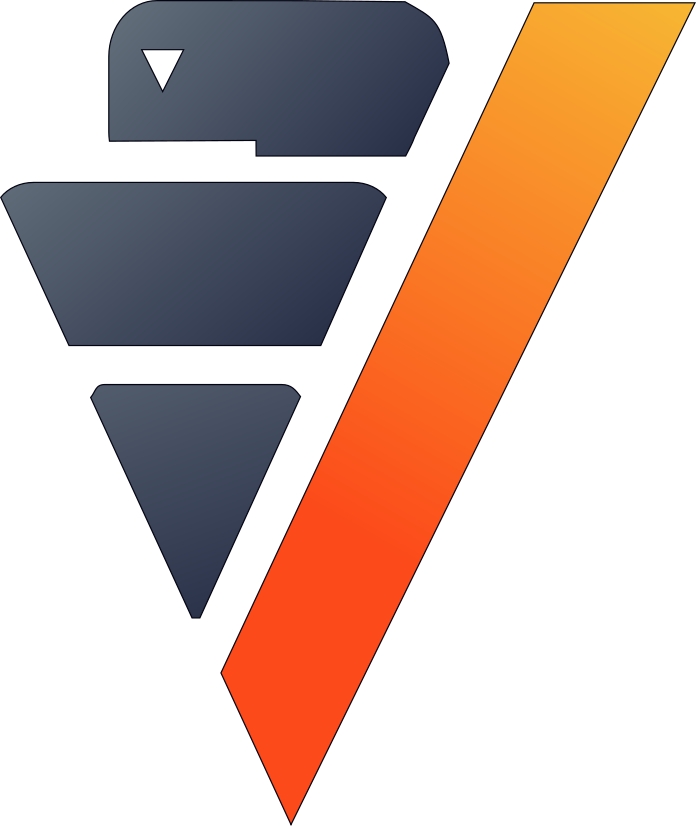

In [21]:
filmtv_movies_complete.drop(columns = ["genre"])

Let's look at the missing values.

,count,percent
"""filmtv_id""",53327.0,100.0
"""avg_vote""",53327.0,100.0
"""votes""",53327.0,100.0
"""duration""",53327.0,100.0
"""period""",53327.0,100.0
"""language_area""",53327.0,100.0
"""Category""",53327.0,100.0
"""title""",53325.0,99.996
"""year""",53317.0,99.981
"""country""",53276.0,99.904

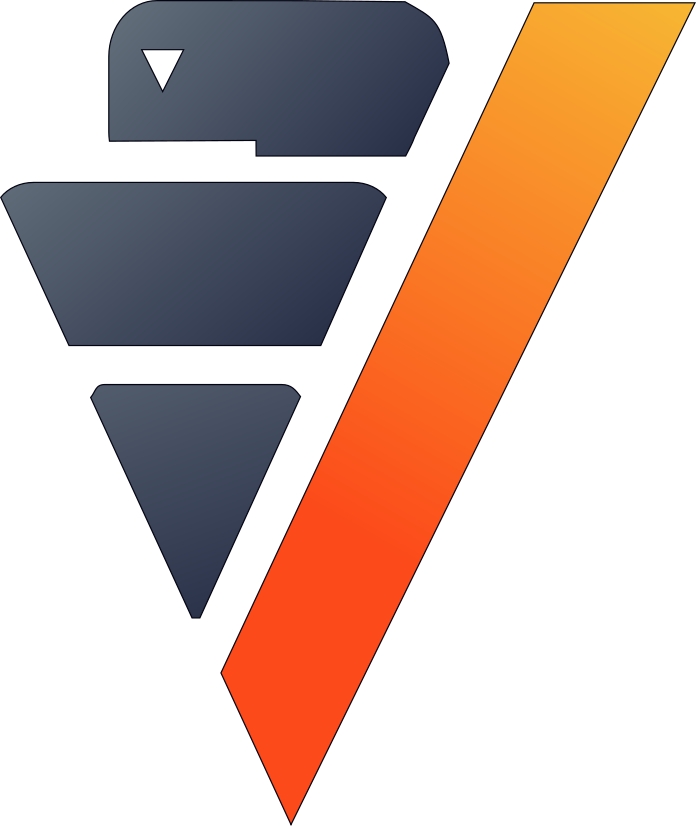

In [22]:
filmtv_movies_complete.count_percent()

Let's impute the missing values for 'notoriety_actors' and 'castings_actors' using different techniques. We can then drop the few remaining missing values.

638 elements were filled.
638 elements were filled.
Nothing was filtered.


,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123votesInteger,123durationInteger,AbcVarchar(1066),123notoriety_directorNumeric(36),123castings_directorInteger,123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9)
1,20918,,1971.0,United States,6.0,3,108,,0.003639514731369,12,0.095049303649486,43.0,Old,English,Action
2,5827,,1966.0,United States,5.9,19,97,,0.003639514731369,12,0.521195486428789,117.0,Old,English,Action
3,29249,,1966.0,Italy,5.3,6,93,,0.052946273830156,148,0.104605062519061,59.0,Old,Italian,Action
4,40271,,1969.0,Italy,7.0,17,83,,0.052946273830156,148,0.32367591745451,72.0,Old,Italian,Action
5,79105,,2017.0,United States,6.6,91,115,,0.113864818024263,40,0.995018806546712,51.0,Recent,English,Action
6,23181,,2002.0,"United States, Czech Republic",6.7,310,119,,0.113864818024263,40,1.02826064857172,71.0,Recent,English,Action
7,44200,,2007.0,"France, Morocco",7.6,24,111,,0.001993067590988,4,0.09931889803802,46.0,Recent,Arabic_Middle_Est,Action
8,13063,,1993.0,United States,7.5,3,90,,0.008492201039861,104,0.005692792518044,14.0,90s,English,Action
9,19911,,1997.0,United States,6.0,1,90,,0.008492201039861,104,0.013927010267358,29.0,90s,English,Action
10,121149,,2015.0,"United States, Canada",3.7,6,90,,0.008492201039861,104,0.040662803700315,34.0,Recent,English,Action

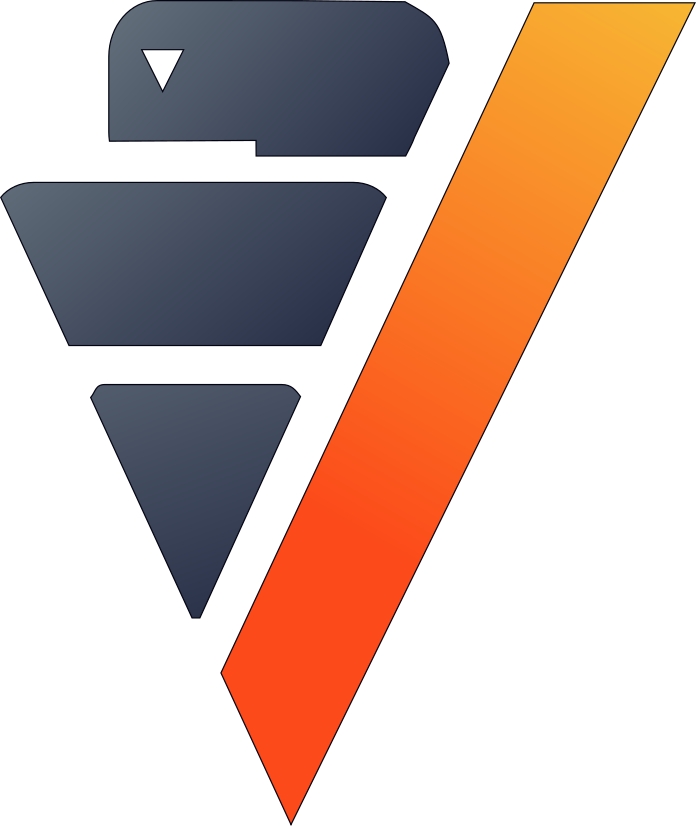

In [23]:
filmtv_movies_complete["notoriety_actors"].fillna(
    method = "median",
    by = [
        "director",
        "Category",
    ],
)
filmtv_movies_complete["castings_actors"].fillna(
    method = "median",
    by = [
        "director",
        "Category",
    ],
)
filmtv_movies_complete.dropna()

Before we export the data, we should normalize the numerical columns to get the dummies of the different categories.

In [24]:
filmtv_movies_complete.normalize(
    method = "minmax",
    columns = [
        "votes", 
        "duration", 
        "notoriety_director",
        "castings_director",
        "notoriety_actors",
        "castings_actors",
    ],
)
for x in ["category", "period", "language_area"]:
    filmtv_movies_complete[x].get_dummies(drop_first = True)

We can export the results to our Vertica database.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123votesNumeric(36),123durationNumeric(36),AbcVarchar(1066),123notoriety_directorNumeric(39),123castings_directorNumeric(36),123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInteger,123Category_AdventureInteger,123Category_AnimationInteger,123Category_ComedyInteger,123Category_DramaInteger,123Category_FantasyInteger,123Category_HorrorInteger,123Category_OthersInteger,123Category_RomanticInteger,123period_90sInteger,123period_OldInteger,123language_area_Arabic_Middle_EstInteger,123Integer,123language_area_EnglishInteger,123language_area_FrenchInteger,123Integer,123language_area_Grec_BalkanInteger,123language_area_HebrewInteger,123language_area_IndianInteger,123language_area_ItalianInteger,123language_area_OthersInteger,123language_area_Russian_Est_EuropeInteger
1,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
2,41,,1985.0,France,4.0,0.0,0.013358778625954,,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0
3,58,,1989.0,United States,7.1,0.139230139230139,0.011450381679389,,0.055372616984402,0.347222222222222,0.563391189467451,0.323308270676692,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0
4,91,,1988.0,United States,6.0,0.0,0.009541984732824,,0.000606585788562,0.055555555555556,0.00906564621201779,0.0827067669172932,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0
5,125,,1943.0,France,6.0,0.0,0.00763358778626,,0.0,0.0,0.0134845792902377,0.131578947368421,Old,French,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0
6,136,,1966.0,United States,4.8,0.002457002457002,0.011450381679389,,0.000259965337955,0.0,0.0877408774087741,0.169172932330827,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0
7,180,,1964.0,United States,2.5,0.000819000819001,0.009732824427481,,0.000173310225303,0.013888888888889,0.0185868525351919,0.112781954887218,Old,English,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0
8,181,,1964.0,Germany,4.5,0.000819000819001,0.008778625954198,,8.6655112652e-05,0.0,0.00628672953396214,0.0977443609022556,Old,German_North_Europe,Action,1,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,0,0,0
9,186,,1953.0,Italy,5.4,0.006552006552007,0.010496183206107,,0.052946273830156,0.5,0.0572183499612772,0.210526315789474,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0
10,193,,1977.0,United States,4.7,0.028665028665029,0.013358778625954,,0.007192374350087,0.263888888888889,0.133661336613366,0.334586466165414,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0

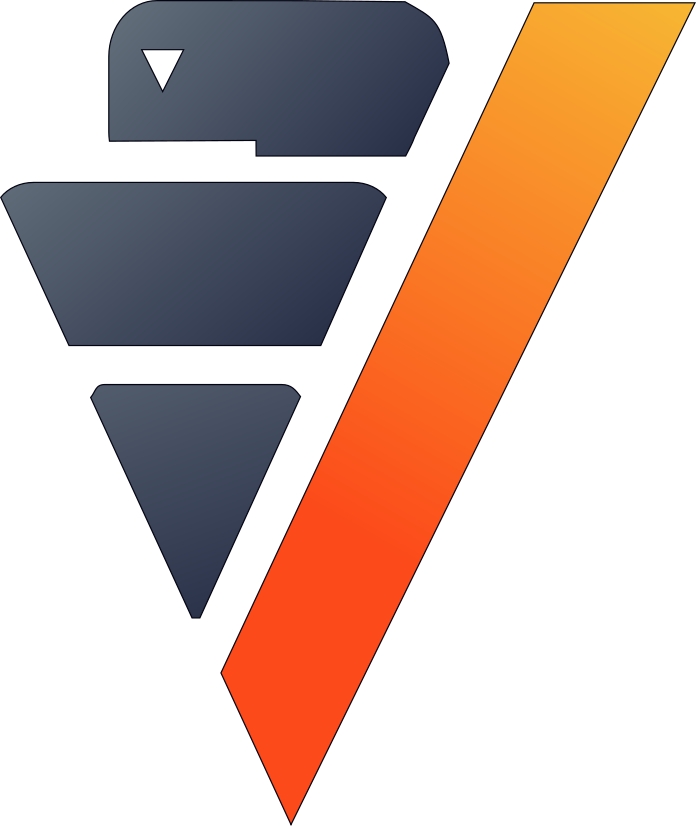

In [25]:
filmtv_movies_complete.to_db(
    name = "filmtv_movies_complete",
    relation_type = "table",
    inplace = True,
)
filmtv_movies_complete.to_db(
    name = "filmtv_movies_mco",
    relation_type = "view",
    db_filter = "votes > 0.02",
)

# Machine Learning : Adjusting the Films Rates

Let's create a model to evaluate an unbiased score for each different movie.



details
            predictor            |coefficient|std_err | t_value |p_value 
---------------------------------+-----------+--------+---------+--------
            Intercept            |  5.51752  | 0.06811|81.01187 | 0.00000
            filmtv_id            |  0.00000  | 0.00000| 2.12608 | 0.03352
              votes              |  5.51964  | 0.13995|39.43918 | 0.00000
            duration             | 14.38180  | 2.01767| 7.12792 | 0.00000
       notoriety_director        | -0.00375  | 0.08850|-0.04239 | 0.96619
        castings_director        |  0.19043  | 0.06989| 2.72457 | 0.00645
        notoriety_actors         | -1.12558  | 0.10928|-10.29957| 0.00000
         castings_actors         |  0.06521  | 0.11143| 0.58525 | 0.55840
         category_action         | -0.21055  | 0.04275|-4.92542 | 0.00000
       category_adventure        | -0.28171  | 0.06659|-4.23056 | 0.00002
       category_animation        |  0.71959  | 0.23813| 3.02187 | 0.00252
         category_comedy    

,value
explained_variance,0.464651819821462
max_error,4.90691407293243
median_absolute_error,0.59345905201954
mean_absolute_error,0.715710573929926
mean_squared_error,0.832067099504979
root_mean_squared_error,0.912177120687084
r2,0.464651819812942
r2_adj,0.463141155492087
aic,-1834.5053132193
bic,-1617.64412628404

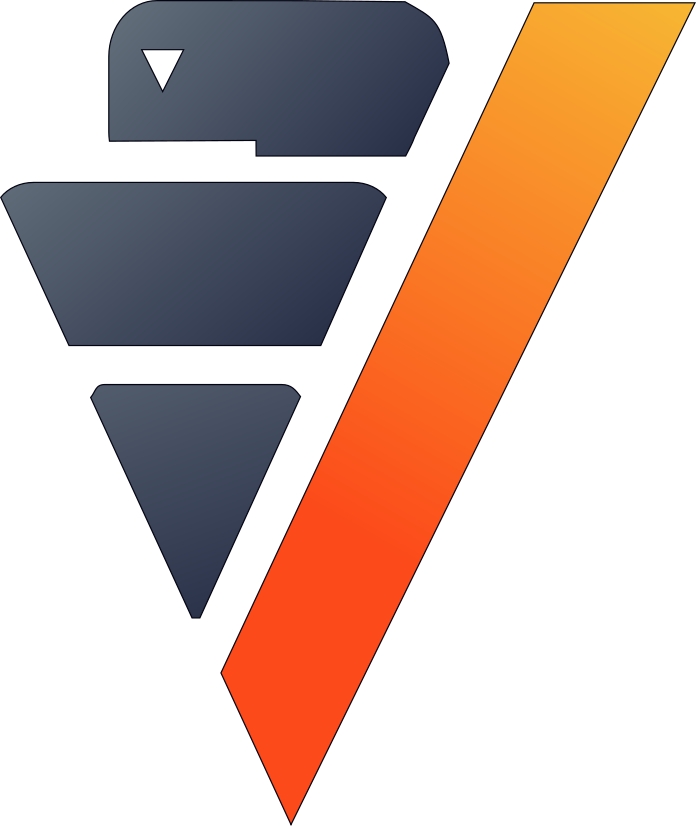

In [27]:
from verticapy.machine_learning.vertica.linear_model import LinearRegression

predictors = filmtv_movies_complete.get_columns(
    exclude_columns = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
    ],
)
model = LinearRegression(
    max_iter = 1000,
    solver = "BFGS",
)
model.fit("filmtv_movies_mco", predictors, "avg_vote")
model.report()

The model is good. Let's add it in our vDataFrame.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123votesNumeric(36),123durationNumeric(36),AbcVarchar(1066),123notoriety_directorNumeric(39),123castings_directorNumeric(36),123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInteger,123Category_AdventureInteger,123Category_AnimationInteger,123Category_ComedyInteger,123Category_DramaInteger,123Category_FantasyInteger,123Category_HorrorInteger,123Category_OthersInteger,123Category_RomanticInteger,123period_90sInteger,123period_OldInteger,123language_area_Arabic_Middle_EstInteger,123Integer,123language_area_EnglishInteger,123language_area_FrenchInteger,123Integer,123language_area_Grec_BalkanInteger,123language_area_HebrewInteger,123language_area_IndianInteger,123language_area_ItalianInteger,123language_area_OthersInteger,123language_area_Russian_Est_EuropeInteger,123unbiased_voteFloat(22)
1,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,5.90569377823793
2,41,,1985.0,France,4.0,0.0,0.013358778625954,,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,7.49914811189327
3,58,,1989.0,United States,7.1,0.139230139230139,0.011450381679389,,0.055372616984402,0.347222222222222,0.563391189467451,0.323308270676692,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.79259465220295
4,91,,1988.0,United States,6.0,0.0,0.009541984732824,,0.000606585788562,0.055555555555556,0.00906564621201779,0.0827067669172932,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.54958422257736
5,125,,1943.0,France,6.0,0.0,0.00763358778626,,0.0,0.0,0.0134845792902377,0.131578947368421,Old,French,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,6.82512508598724
6,136,,1966.0,United States,4.8,0.002457002457002,0.011450381679389,,0.000259965337955,0.0,0.0877408774087741,0.169172932330827,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.44101163132165
7,180,,1964.0,United States,2.5,0.000819000819001,0.009732824427481,,0.000173310225303,0.013888888888889,0.0185868525351919,0.112781954887218,Old,English,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.41295129776288
8,181,,1964.0,Germany,4.5,0.000819000819001,0.008778625954198,,8.6655112652e-05,0.0,0.00628672953396214,0.0977443609022556,Old,German_North_Europe,Action,1,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,0,0,0,6.94621263809108
9,186,,1953.0,Italy,5.4,0.006552006552007,0.010496183206107,,0.052946273830156,0.5,0.0572183499612772,0.210526315789474,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,6.74212869900872
10,193,,1977.0,United States,4.7,0.028665028665029,0.013358778625954,,0.007192374350087,0.263888888888889,0.133661336613366,0.334586466165414,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,6.6224880732505

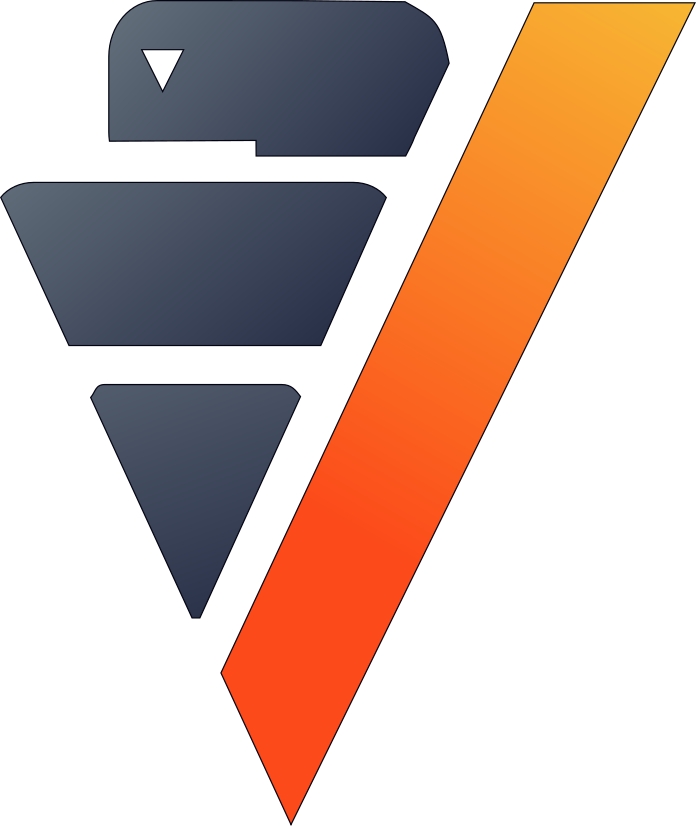

In [28]:
model.predict(
    filmtv_movies_complete,
    name = "unbiased_vote",
)

Since a score can't be greater than 10 or less than 0, we need to adjust the 'unbiased_vote.'

In [30]:
filmtv_movies_complete["unbiased_vote"] = fun.case_when(
    filmtv_movies_complete["unbiased_vote"] > 10, 10,
    filmtv_movies_complete["unbiased_vote"] < 0, 0,
    filmtv_movies_complete["unbiased_vote"],
)

Let's look at the top movies.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123unbiased_voteFloat(22),123votesNumeric(36),123durationNumeric(36),AbcdirectorVarchar(1066),123notoriety_directorNumeric(39),123castings_directorNumeric(36),123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19)
1,5580,,1960.0,United States,9.3,10.0,0.645372645372645,0.012977099236641,Alfred Hitchcock,0.753379549393414,0.708333333333333,0.245045783791171,0.330827067669173,Old,English
2,27984,,1992.0,Germany,9.3,10.0,0.013923013923014,0.283396946564885,Edgar Reitz,0.04107452339688,0.541666666666667,0.0191790806796959,0.203007518796992,90s,German_North_Europe
3,17065,,1971.0,Great Britain,9.2,10.0,0.889434889434889,0.018511450381679,Stanley Kubrick,0.649913344887348,0.152777777777778,0.254658102136577,0.150375939849624,Old,English
4,1963,,1968.0,Great Britain,9.1,10.0,0.806715806715807,0.019274809160305,Stanley Kubrick,0.649913344887348,0.152777777777778,0.138809165869436,0.0413533834586466,Old,English
5,6476,,1980.0,"United States, Great Britain",9.1,10.0,0.955773955773956,0.015076335877863,Stanley Kubrick,0.649913344887348,0.152777777777778,0.415789713452691,0.169172932330827,Old,English
6,4991,,1972.0,United States,9.1,10.0,0.684684684684685,0.026335877862595,Francis Ford Coppola,0.4342287694974,0.347222222222222,0.566671222267779,0.492481203007519,Old,English
7,7025,,1976.0,United States,9.1,10.0,0.709254709254709,0.013358778625954,Martin Scorsese,0.829289428076256,0.472222222222222,0.832809439205505,0.586466165413534,Old,English
8,12849,,1994.0,United States,9.0,10.0,1.0,0.02175572519084,Quentin Tarantino,0.686741767764298,0.125,0.865928659286594,0.541353383458647,90s,English
9,27983,,1984.0,Germany,9.0,10.0,0.033579033579034,0.168702290076336,Edgar Reitz,0.04107452339688,0.541666666666667,0.0119812309234203,0.0413533834586466,Old,German_North_Europe
10,1152,,1984.0,United States,9.0,10.0,0.665028665028665,0.034351145038168,Sergio Leone,0.290467937608319,0.083333333333333,0.667304450822288,0.421052631578947,Old,English

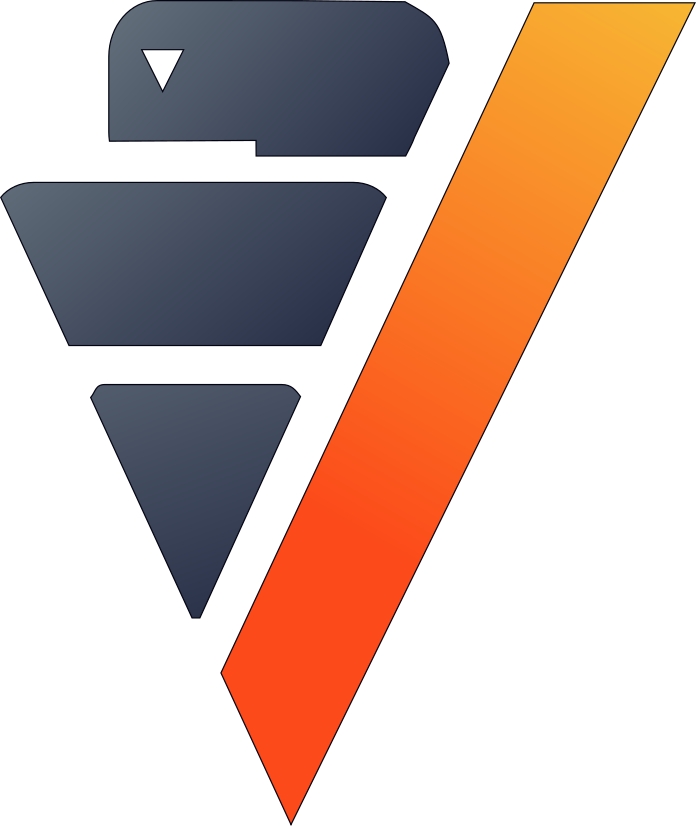

In [31]:
filmtv_movies_complete.search(
    usecols = [
        "filmtv_id",
        "title",
        "year",
        "country",
        "avg_vote",
        "unbiased_vote",
        "votes",
        "duration",
        "director",
        "notoriety_director",
        "castings_director",
        "notoriety_actors",
        "castings_actors",
        "period",
        "language_area",
    ],
    order_by = {
        "unbiased_vote" : "desc", 
        "avg_vote" : "desc",
    },
).head(10)

Great, our results are more consistent. Psycho, Pulp Fiction, and The Godfather are among the top movies.

# Machine Learning : Creating Movie Clusters

Since k-means clustering is sensitive to unnormalized data, let's normalize our new predictors.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123votesNumeric(36),123durationNumeric(36),AbcVarchar(1066),123notoriety_directorNumeric(39),123castings_directorNumeric(36),123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInteger,123Category_AdventureInteger,123Category_AnimationInteger,123Category_ComedyInteger,123Category_DramaInteger,123Category_FantasyInteger,123Category_HorrorInteger,123Category_OthersInteger,123Category_RomanticInteger,123period_90sInteger,123period_OldInteger,123language_area_Arabic_Middle_EstInteger,123Integer,123language_area_EnglishInteger,123language_area_FrenchInteger,123Integer,123language_area_Grec_BalkanInteger,123language_area_HebrewInteger,123language_area_IndianInteger,123language_area_ItalianInteger,123language_area_OthersInteger,123language_area_Russian_Est_EuropeInteger,123unbiased_voteFloat(22)
1,30,,1968.0,Italy,5.5,0.000819000819001,0.011641221374046,,0.004679376083189,0.138888888888889,0.0165368320349875,0.154135338345865,Old,Italian,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.292048831888712
2,41,,1985.0,France,4.0,0.0,0.013358778625954,,0.003206239168111,0.027777777777778,0.0932075987426543,0.266917293233083,Old,French,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,0.567574841850369
3,58,,1989.0,United States,7.1,0.139230139230139,0.011450381679389,,0.055372616984402,0.347222222222222,0.563391189467451,0.323308270676692,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.445403875628512
4,91,,1988.0,United States,6.0,0.0,0.009541984732824,,0.000606585788562,0.055555555555556,0.00906564621201779,0.0827067669172932,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.403384664509853
5,125,,1943.0,France,6.0,0.0,0.00763358778626,,0.0,0.0,0.0134845792902377,0.131578947368421,Old,French,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,0.451028750112581
6,136,,1966.0,United States,4.8,0.002457002457002,0.011450381679389,,0.000259965337955,0.0,0.0877408774087741,0.169172932330827,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.384611253670233
7,180,,1964.0,United States,2.5,0.000819000819001,0.009732824427481,,0.000173310225303,0.013888888888889,0.0185868525351919,0.112781954887218,Old,English,Adventure,0,1,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.379759309324952
8,181,,1964.0,Germany,4.5,0.000819000819001,0.008778625954198,,8.6655112652e-05,0.0,0.00628672953396214,0.0977443609022556,Old,German_North_Europe,Action,1,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,0,0,0,0.471966137135567
9,186,,1953.0,Italy,5.4,0.006552006552007,0.010496183206107,,0.052946273830156,0.5,0.0572183499612772,0.210526315789474,Old,Italian,Drama,0,0,0,0,1,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.436677749985099
10,193,,1977.0,United States,4.7,0.028665028665029,0.013358778625954,,0.007192374350087,0.263888888888889,0.133661336613366,0.334586466165414,Old,English,Action,1,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.4159905526502

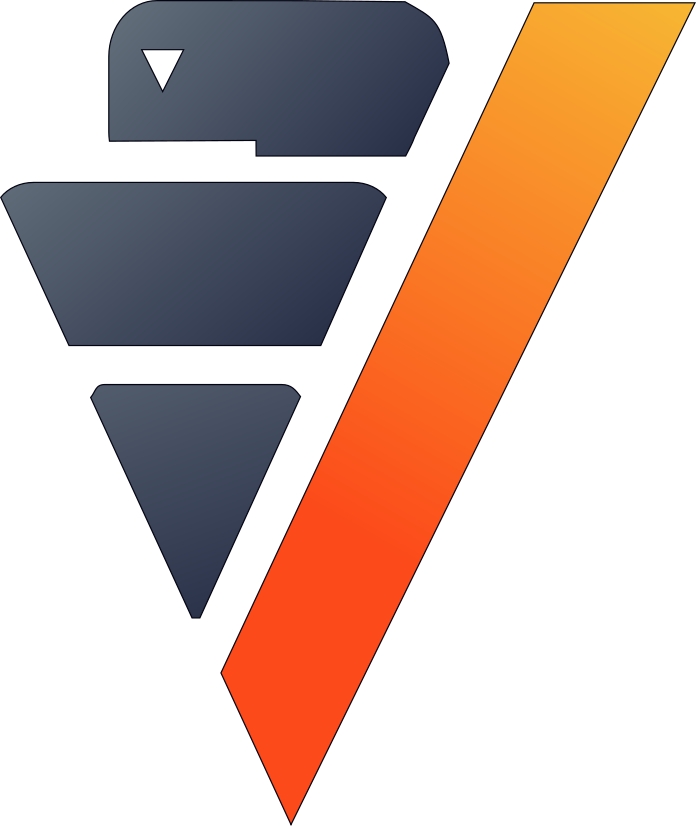

In [32]:
filmtv_movies_complete["unbiased_vote"].normalize(method = "minmax")

Let's compute the elbow curve to find a suitable number of clusters.

In [33]:
predictors = filmtv_movies_complete.get_columns(
    exclude_columns = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
        "filmtv_id",
    ],
)

from verticapy.machine_learning.model_selection import elbow

elbow = elbow(
    filmtv_movies_complete,
    predictors,
    n_cluster = (1, 60),
)

  0%|          | 0/59 [00:00<?, ?it/s]

By looking at the elbow curve, we can choose 15 clusters. Let's create a k-means model.

In [35]:
from verticapy.machine_learning.vertica import KMeans

model_kmeans = KMeans(n_cluster = 15)
model_kmeans.fit(filmtv_movies_complete, predictors)
model_kmeans.clusters_



centers
 votes  |duration|notoriety_director|castings_director|notoriety_actors|castings_actors|category_action|category_adventure|category_animation|category_comedy|category_drama|category_fantasy|category_horror|category_others|category_romantic|period_90s|period_old|language_area_arabic_middle_est|language_area_chinese_japan_asian|language_area_english|language_area_french|language_area_german_north_europe|language_area_grec_balkan|language_area_hebrew|language_area_indian|language_area_italian|language_area_others|language_area_russian_est_europe|unbiased_vote
--------+--------+------------------+-----------------+----------------+---------------+---------------+------------------+------------------+---------------+--------------+----------------+---------------+---------------+-----------------+----------+----------+-------------------------------+---------------------------------+---------------------+--------------------+---------------------------------+----------------------

array([[1.49147825e-02, 1.10079141e-02, 3.35493629e-02, 2.13948443e-01,
        5.31420288e-02, 1.84471756e-01, 1.87978560e-01, 1.12174579e-01,
        1.91424196e-03, 0.00000000e+00, 4.67457887e-01, 2.56508423e-02,
        5.43644717e-02, 0.00000000e+00, 3.94333844e-02, 0.00000000e+00,
        1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        3.76703973e-01],
       [1.32518209e-02, 1.14952429e-02, 1.75346784e-02, 1.05926125e-01,
        4.17490577e-02, 1.26828637e-01, 3.65788058e-02, 2.28617536e-02,
        1.61377084e-03, 0.00000000e+00, 6.32329209e-01, 2.12479828e-02,
        3.06616460e-02, 7.36955352e-02, 2.39376009e-02, 1.55459925e-01,
        2.29693384e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00,

Let's add the clusters in the vDataFrame.

,123filmtv_idInteger,AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),123avg_voteNumeric(8),123votesNumeric(36),123durationNumeric(36),AbcVarchar(1066),123notoriety_directorNumeric(39),123castings_directorNumeric(36),123notoriety_actorsFloat(22),123castings_actorsFloat(22),AbcperiodVarchar(6),Abclanguage_areaVarchar(19),AbcCategoryVarchar(9),123Category_ActionInteger,123Category_AdventureInteger,123Category_AnimationInteger,123Category_ComedyInteger,123Category_DramaInteger,123Category_FantasyInteger,123Category_HorrorInteger,123Category_OthersInteger,123Category_RomanticInteger,123period_90sInteger,123period_OldInteger,123language_area_Arabic_Middle_EstInteger,123Integer,123language_area_EnglishInteger,123language_area_FrenchInteger,123Integer,123language_area_Grec_BalkanInteger,123language_area_HebrewInteger,123language_area_IndianInteger,123language_area_ItalianInteger,123language_area_OthersInteger,123language_area_Russian_Est_EuropeInteger,123unbiased_voteFloat(22),123movies_clusterInteger
1,64,,1991.0,Italy,4.0,0.0,0.008587786259542,,0.018804159445407,0.222222222222222,0.0,0.0037593984962406,90s,Italian,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,0,0,,0,0,0,1,0,0,0.20768451147983,10
2,113,,1990.0,United States,6.0,0.0,0.011450381679389,,0.001733102253033,0.111111111111111,0.0162634959682929,0.075187969924812,90s,English,Thriller,0,0,0,0,0,0,0,0,0,1,0,0,,1,0,,0,0,0,0,0,0,0.30621641040703,12
3,118,,1951.0,Great Britain,8.3,0.010647010647011,0.009541984732824,,0.008058925476603,0.180555555555556,0.0138490273791629,0.0977443609022556,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.416899643007015,5
4,168,,1966.0,Italy,3.8,0.003276003276003,0.009541984732824,,0.000346620450607,0.0,0.00546672133388022,0.075187969924812,Old,Italian,Action,1,0,0,0,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.298190367656484,0
5,171,,1966.0,France,4.0,0.0,0.01087786259542,,0.000779896013865,0.069444444444444,0.00164001640016384,0.056390977443609,Old,French,Action,1,0,0,0,0,0,0,0,0,0,1,0,,0,1,,0,0,0,0,0,0,0.453142335324753,3
6,174,,1984.0,United States,5.3,0.007371007371007,0.011832061068702,,0.006152512998267,0.111111111111111,0.128240171290602,0.214285714285714,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.396240939745186,5
7,199,,1983.0,Italy,5.1,0.083538083538084,0.011450381679389,,0.018630849220104,0.097222222222222,0.12090565350098,0.233082706766917,Old,Italian,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,0,0,,0,0,0,1,0,0,0.37174962257359,11
8,201,,1959.0,United States,6.5,0.008190008190008,0.012213740458015,,0.004246100519931,0.055555555555556,0.0571272379390462,0.203007518796992,Old,English,Thriller,0,0,0,0,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.4365632944532,5
9,205,,1959.0,Germany,7.4,0.003276003276003,0.009923664122137,,0.000346620450607,0.0,0.0185412965240761,0.105263157894737,Old,German_North_Europe,Horror,0,0,0,0,0,0,1,0,0,0,1,0,,0,0,,0,0,0,0,0,0,0.44042173626942,2
10,211,,1988.0,Great Britain,8.0,0.000819000819001,0.011259541984733,,0.009532062391681,0.069444444444444,0.016536832034987,0.075187969924812,Old,English,Comedy,0,0,0,1,0,0,0,0,0,0,1,0,,1,0,,0,0,0,0,0,0,0.407366629085341,5

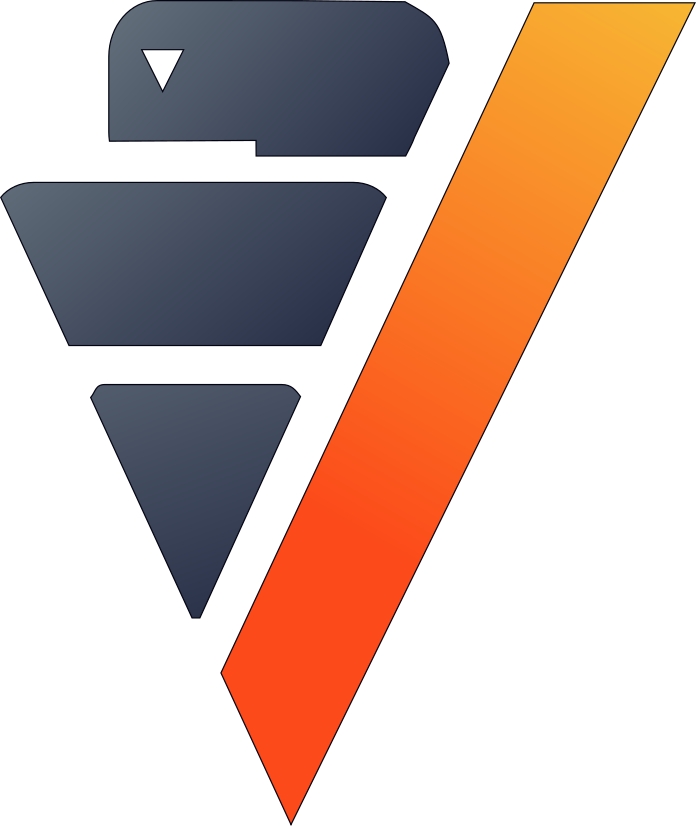

In [36]:
model_kmeans.predict(
    filmtv_movies_complete, 
    name = "movies_cluster",
)

Let's look at the different clusters.

,123avg_voteNumeric(8),AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),AbcCategoryVarchar(9)
1,6.5,Old,,Italian,,1966.0,Italy,Thriller
2,3.0,Old,,Italian,,1954.0,Italy,Drama
3,3.2,Old,,Italian,,1965.0,Italy,Action
4,5.0,Old,,Italian,,1935.0,Italy,Drama
5,4.0,Old,,Italian,,1956.0,Italy,Drama
6,6.0,Old,,Italian,,1941.0,Italy,Romantic
7,5.9,Old,,Italian,,1973.0,Italy,Romantic
8,6.0,Old,,Italian,,1966.0,Italy,Drama
9,6.7,Old,,Italian,,1955.0,Italy,Drama
10,5.2,Old,,Italian,,1983.0,"Germany, Italy",Fantasy

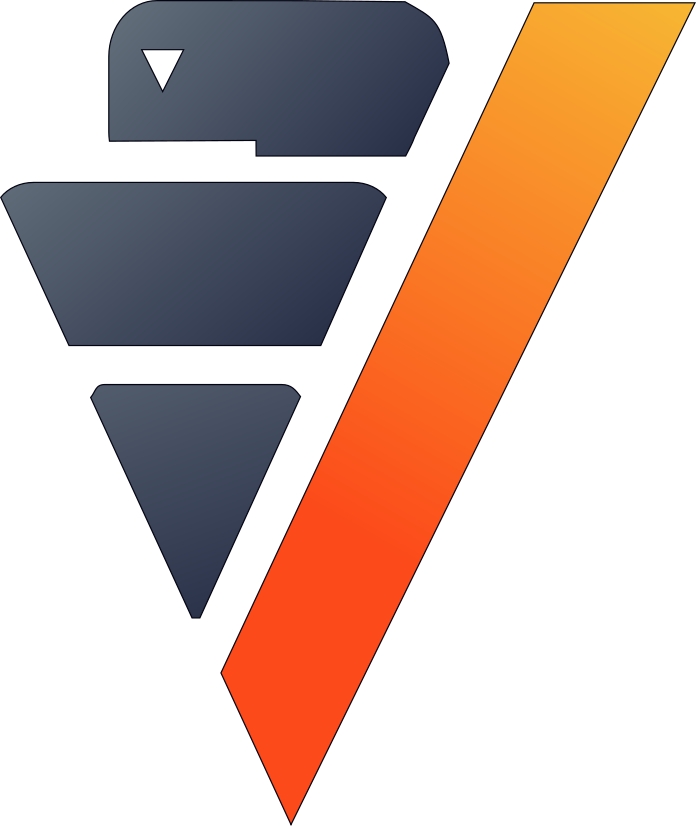

In [37]:
filmtv_movies_complete.search(
    filmtv_movies_complete["movies_cluster"] == 0,
    usecols = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
    ],
)

,123avg_voteNumeric(8),AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),AbcCategoryVarchar(9)
1,4.0,Old,,French,,1985.0,France,Drama
2,4.0,Old,,French,,1976.0,France,Drama
3,4.8,Old,,French,,1981.0,France,Drama
4,7.1,Old,,French,,1972.0,France,Drama
5,7.1,Old,,French,,1947.0,France,Drama
6,6.2,Old,,French,,1983.0,"France, Italy",Drama
7,5.9,90s,,French,,1991.0,France,Others
8,6.0,Old,,French,,1989.0,"Switzerland, Italy",Drama
9,6.9,Old,,French,,1987.0,Canada,Drama
10,5.8,Old,,French,,1943.0,France,Drama

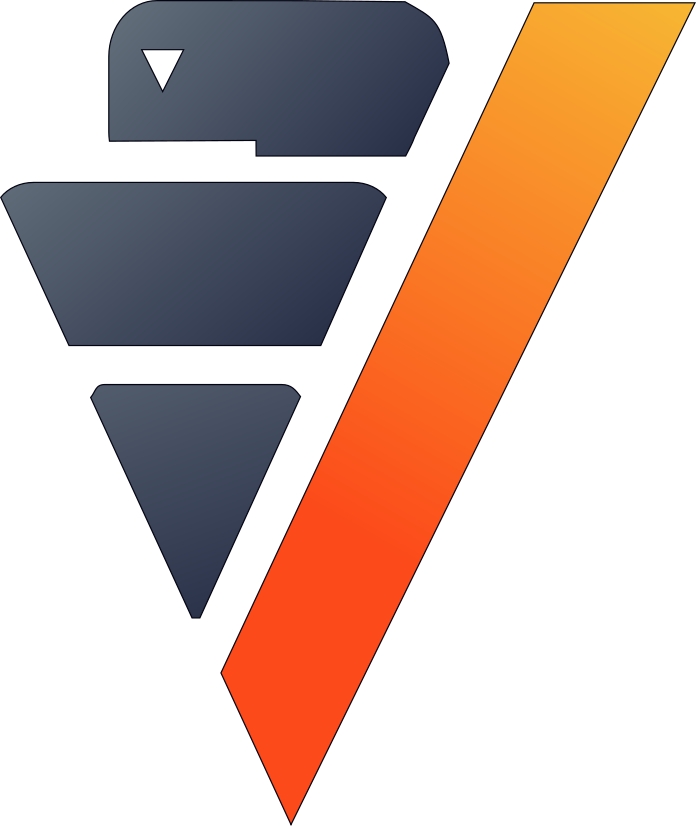

In [38]:
filmtv_movies_complete.search(
    filmtv_movies_complete["movies_cluster"] == 1,
    usecols = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
    ],
)

,123avg_voteNumeric(8),AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),AbcCategoryVarchar(9)
1,6.0,Old,,German_North_Europe,,1956.0,Austria,Comedy
2,6.9,Old,,German_North_Europe,,1988.0,Holland,Thriller
3,6.0,Old,,German_North_Europe,,1939.0,Germany,Romantic
4,6.3,Old,,German_North_Europe,,1986.0,Holland,Comedy
5,6.8,Old,,German_North_Europe,,1983.0,Holland,Horror
6,8.0,Old,,German_North_Europe,,1957.0,Austria,Comedy
7,8.4,Old,,German_North_Europe,,1921.0,Sweden,Fantasy
8,6.0,Old,,German_North_Europe,,1958.0,Austria,Romantic
9,5.5,90s,,German_North_Europe,,1992.0,Sweden,Drama
10,7.8,Old,,German_North_Europe,,1967.0,Germany,Others

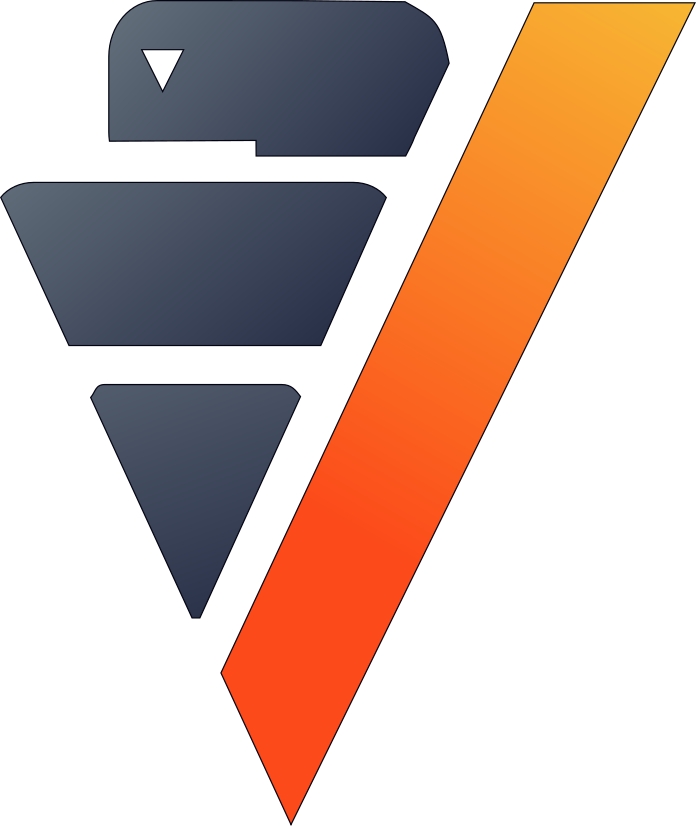

In [39]:
filmtv_movies_complete.search(
    filmtv_movies_complete["movies_cluster"] == 2,
    usecols = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
    ],
)

,123avg_voteNumeric(8),AbcperiodVarchar(6),AbcVarchar(1066),Abclanguage_areaVarchar(19),AbcVarchar(486),123yearNumeric(10),AbccountryVarchar(208),AbcCategoryVarchar(9)
1,4.0,Old,,French,,1966.0,France,Action
2,6.0,Old,,French,,1980.0,Canada,Adventure
3,4.0,Old,,French,,1973.0,France,Comedy
4,8.0,Old,,French,,1969.0,France,Action
5,4.0,Old,,French,,1971.0,France,Thriller
6,8.0,Old,,French,,1921.0,France,Adventure
7,5.0,Old,,French,,1968.0,France,Action
8,5.4,Old,,French,,1963.0,France,Comedy
9,5.1,Old,,French,,1964.0,"France, Italy",Comedy
10,6.0,Old,,French,,1974.0,France,Thriller

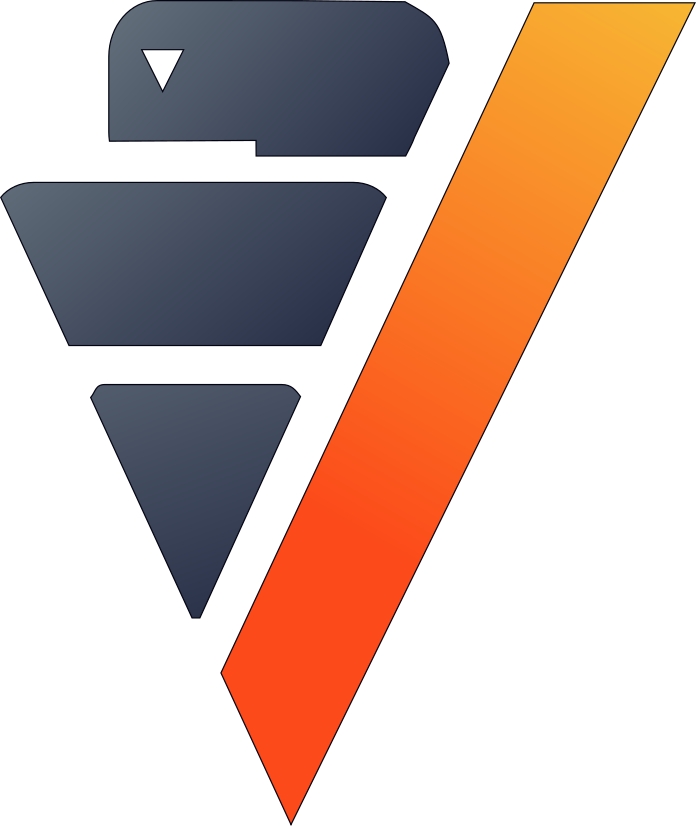

In [40]:
filmtv_movies_complete.search(
    filmtv_movies_complete["movies_cluster"] == 3,
    usecols = [
        "avg_vote",
        "period",
        "director",
        "language_area",
        "title", 
        "year",
        "country",
        "Category",
    ],
)

Each cluster consists of similar movies. These clusters can be used to give movie recommendations or help streaming platforms group movies together.

## Conclusion

We've solved our problem in a Pandas-like way, all without ever loading data into memory!